## TOPIC  -- 2

## **Problem 1:**

What is the problem that the paper aims to solve, and why is this problem important or interesting? 

Ans: DDPMs are unsupervised machine learning algorithms that use the concept of diffusion to remove noise from data. They work by iteratively applying transformations to the data to smooth out noise and improve the quality of the output. DDPMs can learn complex, high-dimensional distributions without the need for labeled examples or manual feature engineering, making them useful for tasks such as denoising images or reconstructing missing data.

Image generation with probabilistic diffusion models is a technique that can be used to generate new, realistic images from a set of training data.This can be useful for a variety of tasks, such as creating new images for a dataset to improve the performance of a machine learning model, or generating new, original images for artistic or creative purposes.

One of the main problems that this technique can solve is the issue of data scarcity. In many cases, it can be difficult or impossible to collect enough high-quality training data for a machine learning model to perform well. By using probabilistic diffusion models to generate new images, it is possible to augment the existing dataset with additional, synthetic data, which can improve the model's performance.



## **Problem 2:**

Implement DDPM and test it on 2-dimensional Swiss roll data. You should output Fig.3 of the blog intro 2. 


In [ ]:
#%pip install matplotlib-venn
#!apt-get -qq install -y libfluidsynth1
#!apt-get -qq install -y graphviz && pip install pydot
#import pydot
#!pip install cartopy
#import cartopy
%matplotlib inline
import numpy as npy
import matplotlib.pyplot as plot
from sklearn.datasets import make_swiss_roll as msr

from pickle import GLOBAL
import torch
import torch.optim as to
import torch.nn as tnn
import torch.nn.functional as FN


import seaborn as ses; ses.set()

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse
# from sklearn.datasets import make_swiss_roll
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA

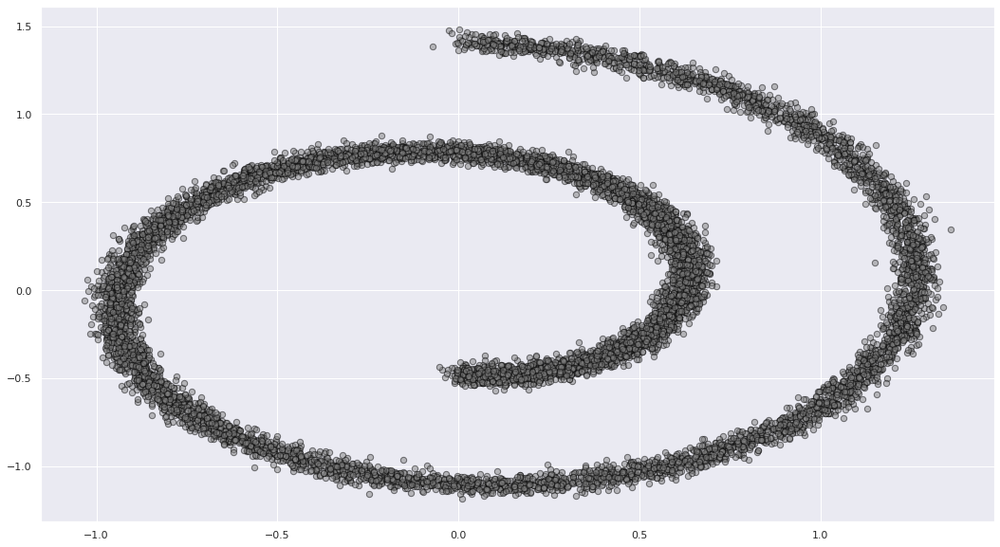

In [ ]:
#A Sample
def sample(s, n=0.3):
    x, _= msr(s, noise=n)
    return x[:, [0, 2]] / 10.0
d = sample(10**4).T
# Plotting the sample
plot.figure(figsize=(18, 10))
plot.scatter(*d, alpha=0.5, color='grey', edgecolor='black', s=40);

In [ ]:
# denoising the data
def denoise(scorenet, sample, sigma=0.01):
    modified_sample = sample + torch.randn_like(sample) * sigma
    goal = - 1 / (sigma ** 2) * (modified_sample - sample)
    score = scorenet(modified_sample)
    goal = goal.view(goal.shape[0], -1)
    score = score.view(score.shape[0], -1)
    l = 1 / 2. * ((score - goal) ** 2).sum(dim=-1).mean(dim=0)
    return l

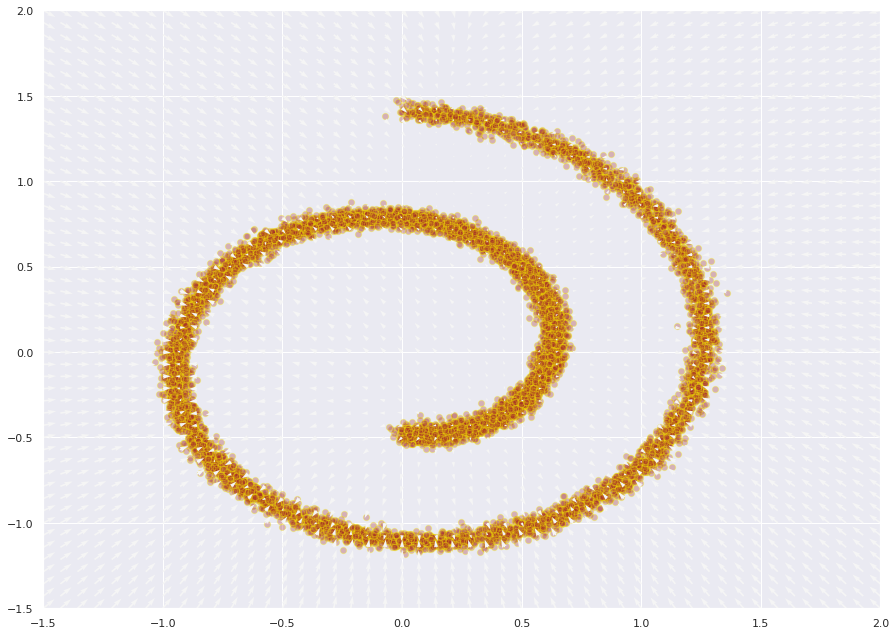

In [ ]:
# Our approximation model
model = tnn.Sequential(
    tnn.Linear(2, 128), tnn.Softplus(),
    tnn.Linear(128, 128), tnn.Softplus(),
    tnn.Linear(128, 2))
# Creating ADAM optimizer over our approximation model
optim = to.Adam(model.parameters(), lr=1e-3)
data = torch.tensor(d.T).float()
for t in range(5000):
    # Computing the loss.
    l = denoise(model, data)
    # All the network gradient were zeroed before backward pass
    optim.zero_grad()
    # Backward pass is computing loss gradient according to the parameters
    l.backward()
    # Updating parameters after calling the step function
    optim.step()
def plot_grad(model, data, plot_scatter=True):
    xx = npy.stack(npy.meshgrid(npy.linspace(-1.5, 2.0, 50), npy.linspace(-1.5, 2.0, 50)), axis=-1).reshape(-1, 2)
    score = model(torch.from_numpy(xx).float()).detach()
    score_norm = npy.linalg.norm(score, axis=-1, ord=2, keepdims=True)
    score_log1p = score / (score_norm + 1e-9) * npy.log1p(score_norm)
    # Plotting the gradient
    plot.figure(figsize=(15,11))
    if (plot_scatter):
        plot.scatter(*d, alpha=0.3, color='brown', edgecolor='yellow', s=40)
    plot.quiver(xx.T[0], xx.T[1], score_log1p[:,0], score_log1p[:,1], width=0.002, color='whitesmoke')
    plot.xlim(-1.5, 2.0)
    plot.ylim(-1.5, 2.0)
plot_grad(model, d)

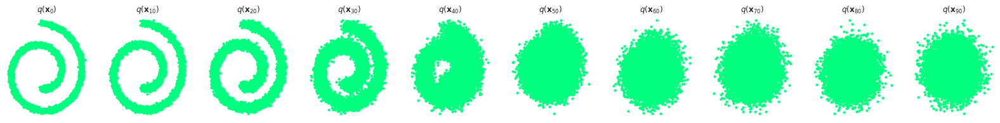

In [ ]:
step = 100
# Making beta schedules
def make_beta(schedule='linear', n_timestep=1000, start=1e-5, end=1e-2):
    if schedule == 'linear':
        beta = torch.linspace(start, end, n_timestep)
    elif schedule == "quad":
        beta = torch.linspace(start ** 0.5, end ** 0.5, n_timestep) ** 2
    elif schedule == "sigmoid":
        beta = torch.linspace(-6, 6, n_timestep)
        beta = torch.sigmoid(beta) * (end - start) + start
    return beta
# Extraction is performed
def ex(input, t, x):
    shape = x.shape
    o = torch.gather(input, 0, t.to(input.device))
    re = [t.shape[0]] + [1] * (len(shape) - 1)
    return o.reshape(*re)
# Creating the schedule
beta = make_beta(schedule='sigmoid', n_timestep=step, start=1e-5, end=1e-2)
# Here we are fixing the timesteps variables
alpha = 1 - beta
alpha_prod = torch.cumprod(alpha, 0)
alpha_prod_p = torch.cat([torch.tensor([1]).float(), alpha_prod[:-1]], 0)
alpha_bar_sqrt = torch.sqrt(alpha_prod)
one_minus_alpha_bar_log = torch.log(1 - alpha_prod)
one_minus_alpha_bar_sqrt = torch.sqrt(1 - alpha_prod)
# Sampling the function
def s_sample(x_0, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_0)
    alpha_t = ex(alpha_bar_sqrt, t, x_0)
    alpha_1_m_t = ex(one_minus_alpha_bar_sqrt, t, x_0)
    return (alpha_t * x_0 + alpha_1_m_t * noise)
#Performing the diffusion
def diffuse():
    fig, axs = plot.subplots(1, 10, figsize=(28, 3))
    for j in range(10):
        q_i = s_sample(data, torch.tensor([j * 10]))
        axs[j].scatter(q_i[:, 0], q_i[:, 1], s=10, color='springgreen');
        axs[j].set_axis_off(); axs[j].set_title('$q(\mathbf{x}_{'+str(j*10)+'})$')
diffuse()


In [ ]:
# Creating a class
class ConditionLinear(tnn.Module):
    def __init__(slf, num_in, num_out, step):
        super(ConditionLinear, slf).__init__()
        slf.num_out = num_out
        slf.lin = tnn.Linear(num_in, num_out)
        slf.embed = tnn.Embedding(step, num_out)
        slf.embed.weight.data.uniform_()

    def forward(slf, x, y):
        o = slf.lin(x)
        g = slf.embed(y)
        o = g.view(-1, slf.num_out) * o
        return o
# Creating a class
class ConditionModel(tnn.Module):
    def __init__(slf, step):
        super(ConditionModel, slf).__init__()
        slf.lin1 = ConditionLinear(2, 128, step)
        slf.lin2 = ConditionLinear(128, 128, step)
        slf.lin3 = tnn.Linear(128, 4)
    
    def forward(slf, x, y):
        x = FN.softplus(slf.lin1(x, y))
        x = FN.softplus(slf.lin2(x, y))
        return slf.lin3(x)
model = ConditionModel(step)
    
def p_mean_var(model, x, t):
    # Revising the model
    o = model(x, t)
    # Extracting the variance and mean of the model
    mean, log_var1 = torch.split(o, 2, dim=-1)
    var = torch.exp(log_var1)
    return mean, log_var1

In [ ]:
# Sampling function
def p_sample(model, x, t):
    mean, log_var1 = p_mean_var(model, x, torch.tensor(t))
    noise = torch.randn_like(x)
    shape = [x.shape[0]] + [1] * (x.ndimension() - 1)
    nonzero_mask = (1 - (t == 0))
    sample = mean + torch.exp(0.5 * log_var1) * noise
    return (sample) 
# Revising the model
def p_l(model, shape):
    cur_x = torch.randn(shape)
    xs = [cur_x]
    for i in reversed(range(step)):
        cur_x = p_sample(model, cur_x, i)
        xs.append(cur_x)
    return xs

In [ ]:
def norm_kl(mean1, logvar11, mean2, logvar22):
    k_l = 0.5 * (-1.0 + logvar22 - logvar11 + torch.exp(logvar11 - logvar22) + ((mean1 - mean2) ** 2) * torch.exp(-logvar22))
    return k_l
def approx_normal_cdf(x):
    return 0.5 * (1.0 + torch.tanh(torch.tensor(npy.sqrt(2.0 / npy.pi)) * (x + 0.044715 * torch.pow(x, 3))))
def discretized_likelihood(x, means, log_scale):
    
    center_x = x - means
    i_stdv = torch.exp(-log_scale)
    plus_i = i_stdv * (center_x + 1. / 255.)
    c_plus = approx_normal_cdf(plus_i)
    min_i = i_stdv * (center_x - 1. / 255.)
    c_min = approx_normal_cdf(min_i)
    log_c_plus = torch.log(torch.clamp(c_plus, min=1e-12))
    log_one_minus_c_min = torch.log(torch.clamp(1 - c_min, min=1e-12))
    c_delta = c_plus - c_min
    log_prob = torch.where(x < -0.999, log_c_plus, torch.where(x > 0.999, log_one_minus_c_min, torch.log(torch.clamp(c_delta, min=1e-12))))
    return log_prob

In [ ]:
def loss_var(model, x_0):
    bat_size = x_0.shape[0]
    # Here we are selecting a random step for each example
    t = torch.randint(0, step, size=(bat_size // 2 + 1,))
    t = torch.cat([t, step - t - 1], dim=0)[:bat_size].long()
    # Performing diffusion for the step t
    x_t = s_sample(x_0, t)
    # Computing the variance and the true mean
    true_mean, true_var = q(x_0, x_t, t)
    # Infer the variance and the mean of the model
    model_mean, model_var = p_mean_var(model, x_t, t)
    # Computing K_L loss of our model
    k_l = norm_kl(true_mean, true_var, model_mean, model_var)
    k_l = torch.mean(k_l.view(bat_size, -1), dim=1) / npy.log(2.)
    # NLL of the decoder
    decode_nll = -discretized_likelihood(x_0, means=model_mean, log_scales=0.5 * model_var)
    decode_nll = torch.mean(decode_nll.view(bat_size, -1), dim=1) / npy.log(2.)
    #decoding
    output = torch.where(t == 0, decode_nll, k_l)
    return output.mean(-1)

In [ ]:
# Creating a class
class ConditionModel(tnn.Module):
    def __init__(slf, n_steps):
        super(ConditionModel, slf).__init__()
        slf.lin1 = ConditionLinear(2, 128, n_steps)
        slf.lin2 = ConditionLinear(128, 128, n_steps)
        slf.lin3 = tnn.Linear(128, 2)
    
    def forward(slf, x, y):
        x = FN.softplus(slf.lin1(x, y))
        x = FN.softplus(slf.lin2(x, y))
        return slf.lin3(x)
# Sampling function    
def p_sample(model, x, t):
    t = torch.tensor([t])
    # Factor to the model output
    ep_factor = ((1 - ex(alpha, t, x)) / ex(one_minus_alpha_bar_sqrt, t, x))
    # Model output
    ep_theta = model(x, t)
    # Final values
    mean = (1 / ex(alpha, t, x).sqrt()) * (x - (ep_factor * ep_theta))
    # Generating z
    z = torch.randn_like(x)
    # fixing the sigma
    sigma_t = ex(beta, t, x).sqrt()
    sample = mean + sigma_t * z
    return (sample)

In [ ]:
# Estimating the noise
def noise_est(model, x_0):
    bat_size = x_0.shape[0]
    # Here we are selecting for each example
    t = torch.randint(0, step, size=(bat_size // 2 + 1,))
    t = torch.cat([t, step - t - 1], dim=0)[:bat_size].long()
    
    a = ex(alpha_bar_sqrt, t, x_0)
    
    am1 = ex(one_minus_alpha_bar_sqrt, t, x_0)
    e = torch.randn_like(x_0)
    
    x = x_0 * a + e * am1
    out = model(x, t)
    return (e - out).square().mean()

In [ ]:
# Creating a class
class EMA(object):
    def __init__(slf, mu=0.999):
        slf.mu = mu
        slf.shadow = {}

    def register(slf, modul):
        for name, para in modul.named_parameters():
            if para.requires_grad:
                slf.shadow[name] = para.data.clone()

    def update(slf, modul):
        for name, para in modul.named_parameters():
            if para.requires_grad:
                slf.shadow[name].data = (1. - slf.mu) * para.data + slf.mu * slf.shadow[name].data

    def ema(slf, modul):
        for name, para in modul.named_parameters():
            if para.requires_grad:
                para.data.copy_(slf.shadow[name].data)

    def copy(slf, modul):
        md_copy = type(modul)(modul.config).to(modul.config.device)
        md_copy.load_state_dict(modul.state_dict())
        slf.ema(md_copy)
        return md_copy

    def dict(slf):
        return slf.shadow

    def load_state_dict(slf, state_dict):
        slf.shadow = state_dict

tensor(0.6300, grad_fn=<MeanBackward0>)
tensor(0.7297, grad_fn=<MeanBackward0>)
tensor(0.6935, grad_fn=<MeanBackward0>)
tensor(0.7252, grad_fn=<MeanBackward0>)
tensor(0.8929, grad_fn=<MeanBackward0>)
tensor(0.4020, grad_fn=<MeanBackward0>)
tensor(0.6492, grad_fn=<MeanBackward0>)
tensor(0.6870, grad_fn=<MeanBackward0>)
tensor(0.2616, grad_fn=<MeanBackward0>)
tensor(1.1211, grad_fn=<MeanBackward0>)
tensor(0.4666, grad_fn=<MeanBackward0>)


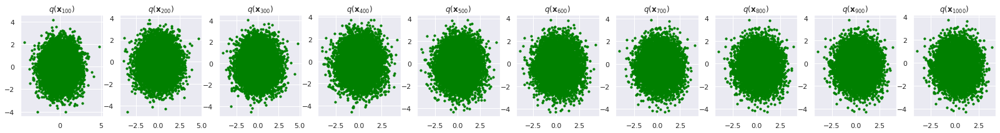

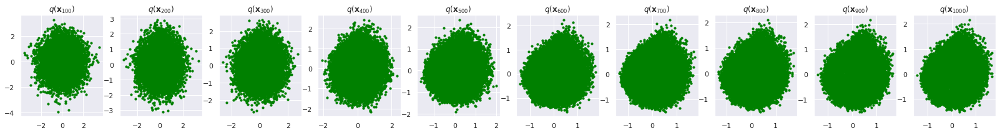

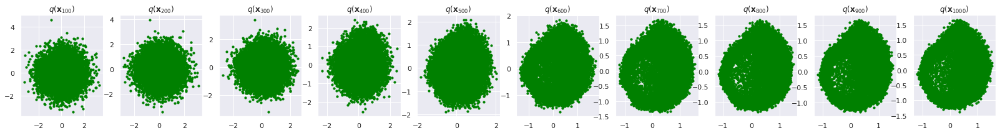

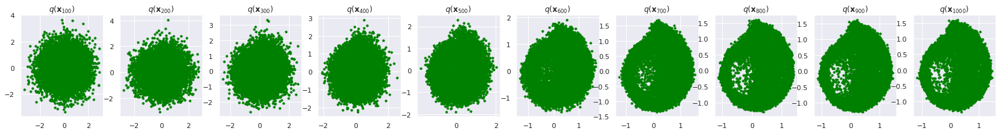

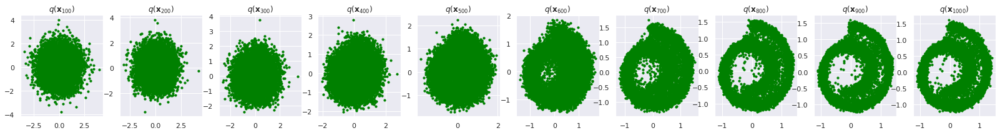

...

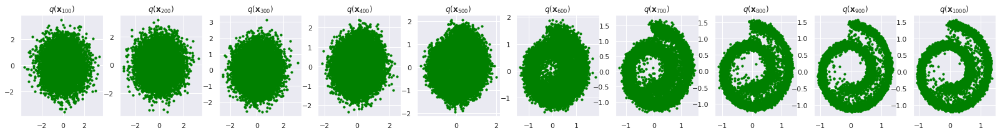

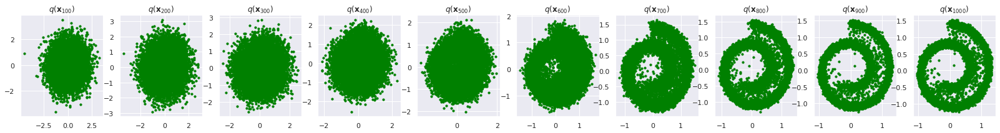

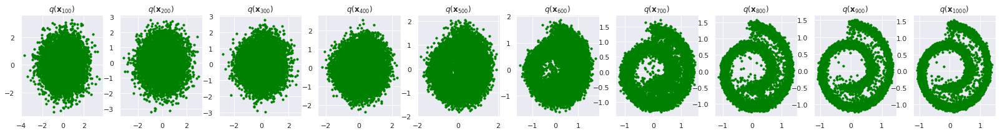

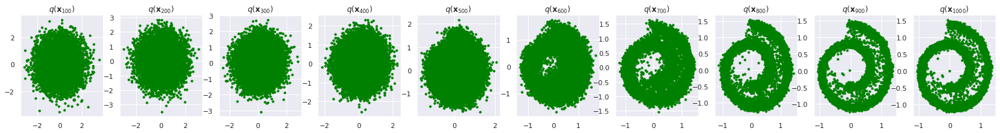

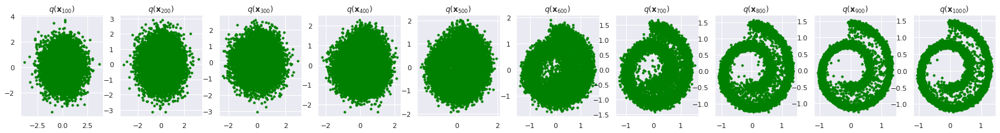

In [ ]:
model = ConditionModel(step)
optimizer = to.Adam(model.parameters(), lr=1e-3)
dataset = torch.tensor(d.T).float()
# Creating EMA model
ema = EMA(0.9)
ema.register(model)
# The size of the batch
batch_size = 128
for t in range(2001):
    # X is a torch Variable
    permutation = torch.randperm(dataset.size()[0])
    for i in range(0, dataset.size()[0], batch_size):
        # Retrieving the current batch
        indices = permutation[i:i+batch_size]
        batch_x = dataset[indices]
        # Computing the loss.
        loss = noise_est(model, batch_x)
        # zero all of the network gradients before the backward pass
        optimizer.zero_grad()
        # Backward pass: computing the gradient of the loss with respect to parameters
        loss.backward()
        # Performing gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)
        # Calling the step function to update the parameters
        optimizer.step()
        # Updating the exponential moving average
        ema.update(model)
    # Printing loss
    if (t % 200 == 0):
        print(loss)
        x_seq = p_l(model, dataset.shape)
        fig, axs = plot.subplots(1, 10, figsize=(28, 3))
        for i in range(1, 11):
            cur_x = x_seq[i * 10].detach()
            axs[i-1].scatter(cur_x[:, 0], cur_x[:, 1], s=10, color="green");
            #axs[i-1].set_axis_off(); 
            axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*100)+'})$')

## Problem 3

Test DDPM on the mixture of 8 Gaussians and 25 Gaussians respectively. These Gaussians can be either identical or with different parameters at your choice. You should output figures like those in Problem 2. 

In [ ]:

%matplotlib inline
import matplotlib.pyplot as pt
import seaborn as ses; ses.set()
import numpy as npy
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
from sklearn.mixture import GaussianMixture
from matplotlib.patches import Ellipse
from sklearn.datasets import make_swiss_roll
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA

In [ ]:
SC, f = make_blobs(n_samples=400, centers=4,
                  cluster_std=0.60, random_state=0)
SC = SC[:, ::-1] 

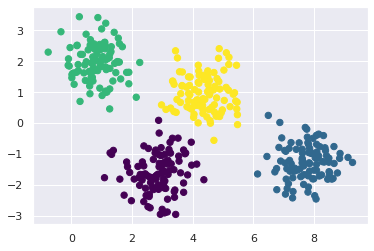

In [ ]:
K_means= KMeans(4, random_state=0)
l = K_means.fit(SC).predict(SC)
pt.scatter(SC[:, 0], SC[:, 1], c=l, s=40, cmap='viridis');

In [ ]:
def plotting_kmeans(kmeans, SC, n_clusters=4, rseed=0, ap=None):
    label_s = kmeans.fit_predict(SC)
    ap = ap or pt.gca()
    ap.axis('equal')
    ap.scatter(SC[:, 0], SC[:, 1], c=label_s, s=40, cmap='viridis', zorder=2)
    ct = kmeans.cluster_centers_
    rs = [cdist(SC[label_s == i], [center]).max()
             for i, center in enumerate(ct)]
    for c, r in zip(ct, rs):
        ap.add_patch(pt.Circle(c, r, fc='#CCCCCC', lw=3, alpha=0.5, zorder=1))

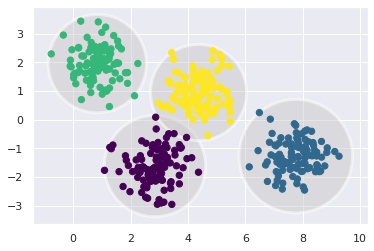

In [ ]:
K_means= KMeans(n_clusters=4, random_state=0)
plotting_kmeans(K_means, SC)

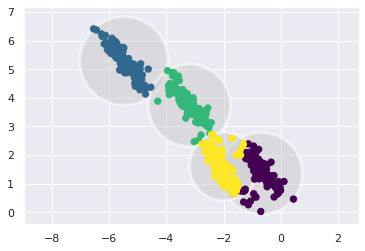

In [ ]:
rng = npy.random.RandomState(13)
SC_stretched = npy.dot(SC, rng.randn(2, 2))
K_means= KMeans(n_clusters=4, random_state=0)
plotting_kmeans(K_means, SC_stretched)

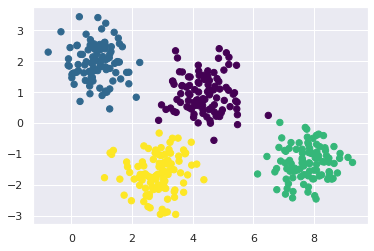

In [ ]:
GM = GaussianMixture(n_components=4, covariance_type='full').fit(SC)
label_s = GM.predict(SC)
pt.scatter(SC[:, 0], SC[:, 1], c=label_s, s=40, cmap='viridis');

In [ ]:
def dra_ellipse(position, covariance, ap=None, **kwargs):
    ap = ap or pt.gca()
    if covariance.shape == (2, 2):
        U, s, Vt = npy.linalg.svd(covariance)
        angle = npy.degrees(npy.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * npy.sqrt(s)
    else:
        angle = 0
        width, height = 2 * npy.sqrt(covariance)
    for nsig in range(1, 4):
        ap.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_g(GM, SC, label=True, ap=None):
    ap = ap or pt.gca()
    label_s = GM.fit(SC).predict(SC)
    if label:
        ap.scatter(SC[:, 0], SC[:, 1], c=label_s, s=40, cmap='viridis', zorder=2)
    else:
        ap.scatter(SC[:, 0], SC[:, 1], s=40, zorder=2)
    ap.axis('equal')
    
    w_factor = 0.2 / GM.weights_.max()
    for pos, covar, w in zip(GM.means_, GM.covariances_, GM.weights_):
        dra_ellipse(pos, covar, alpha=w * w_factor)


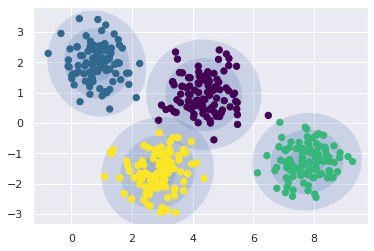

In [ ]:
GM= GaussianMixture(n_components=4, random_state=42)
plot_g(GM, SC)

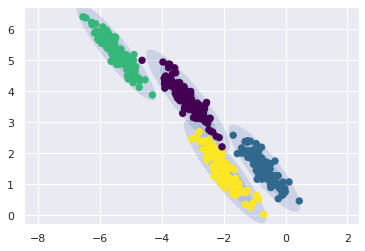

In [ ]:
GM = GaussianMixture(n_components=4, covariance_type='full', random_state=42)
plot_g(GM, SC_stretched)


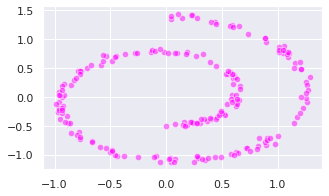

In [ ]:
def samplebatch(size, noise=0.3):
    X_moon, _= make_swiss_roll(size, noise=noise)
    return X_moon[:, [0, 2]] / 10.0
X_moon = samplebatch(200).T
pt.figure(figsize=(5, 3))
pt.scatter(*X_moon, alpha=0.5, color='magenta', edgecolor='white', s=40);

In [ ]:
digits = load_digits()
digits.data.shape

(1797, 64)

In [ ]:
def plt_digits(data):
    fig, ap = pt.subplots(10, 10, figsize=(10, 6),
                           subplot_kw=dict(xticks=[], yticks=[]))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)
    for i, axi in enumerate(ap.flat):
        imj = axi.imshow(data[i].reshape(8, 8), cmap='bone')
        imj.set_clim(0, 16)


In [ ]:
pcea = PCA(0.99, whiten=True)
data = pcea.fit_transform(digits.data)
data.shape

(1797, 41)

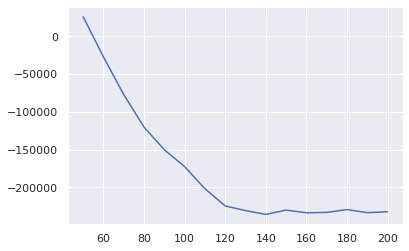

In [ ]:
n = npy.arange(50, 210, 10)
models = [GaussianMixture(n, covariance_type='full', random_state=0)
          for n in n]
aics = [model.fit(data).aic(data) for model in models]
pt.plot(n, aics);

In [ ]:
GM = GaussianMixture(110, covariance_type='full', random_state=0)
GM.fit(data)
print(GM.converged_)

True


In [ ]:
def samplebatch(size, noise=0.3):
    p, _= make_swiss_roll(size, noise=noise)
    return p[:, [0, 2]] / 10.0
data = samplebatch(10**4).T

In [ ]:
def denoising_score_matching(scorenet, samples, sigma=0.01):
    perturbed_samples = samples + torch.randn_like(samples) * sigma
    aim = - 1 / (sigma ** 2) * (perturbed_samples - samples)
    mark = scorenet(perturbed_samples)
    aim = aim.view(aim.shape[0], -1)
    mark = mark.view(mark.shape[0], -1)
    loss = 1 / 2. * ((mark - aim) ** 2).sum(dim=-1).mean(dim=0)
    return loss

In [ ]:
model = nn.Sequential(
    nn.Linear(2, 128), nn.Softplus(),
    nn.Linear(128, 128), nn.Softplus(),
    nn.Linear(128, 2))
optimizer = optim.Adam(model.parameters(), lr=1e-3)
dataset = torch.tensor(data.T).float()

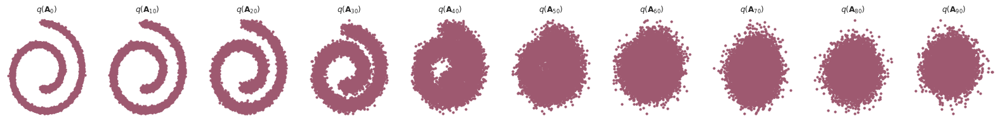

In [ ]:
n_steps = 100
def make_beta_schedule(schedule='linear', n_timesteps=1000, start=1e-5, end=1e-2):
    if schedule == 'linear':
        betas = torch.linspace(start, end, n_timesteps)
    elif schedule == "quad":
        betas = torch.linspace(start ** 0.5, end ** 0.5, n_timesteps) ** 2
    elif schedule == "sigmoid":
        betas = torch.linspace(-6, 6, n_timesteps)
        betas = torch.sigmoid(betas) * (end - start) + start
    return betas
def extract(input, t, A):
    shape = A.shape
    out = torch.gather(input, 0, t.to(input.device))
    reshape = [t.shape[0]] + [1] * (len(shape) - 1)
    return out.reshape(*reshape)
betas = make_beta_schedule(schedule='sigmoid', n_timesteps=n_steps, start=1e-5, end=1e-2)
alphas = 1 - betas
alphas_prod = torch.cumprod(alphas, 0)
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[:-1]], 0)
alphas_bar_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_bar_log = torch.log(1 - alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)
def q_sample(x_0, t, noise=None):
    if noise is None:
        noise = torch.randn_like(x_0)
    alphas_t = extract(alphas_bar_sqrt, t, x_0)
    alphas_1_m_t = extract(one_minus_alphas_bar_sqrt, t, x_0)
    return (alphas_t * x_0 + alphas_1_m_t * noise)
def plot_diffusion():
    fig, axs = pt.subplots(1, 10, figsize=(28, 3))
    for i in range(10):
        q_i = q_sample(dataset, torch.tensor([i * 10]))
        axs[i].scatter(q_i[:, 0], q_i[:, 1], s=10, color='#9e5970');
        axs[i].set_axis_off(); axs[i].set_title('$q(\mathbf{A}_{'+str(i*10)+'})$')
plot_diffusion()

In [ ]:
class ConditionalLinear(nn.Module):
    def __init__(self, num_in, num_out, n_steps):
        super(ConditionalLinear, self).__init__()
        self.num_out = num_out
        self.lin = nn.Linear(num_in, num_out)
        self.embed = nn.Embedding(n_steps, num_out)
        self.embed.weight.data.uniform_()

    def forward(self, SC, f):
        out = self.lin(SC)
        gamma = self.embed(f)
        out = gamma.view(-1, self.num_out) * out
        return out
class ConditionalModel(nn.Module):
    def __init__(self, n_steps):
        super(ConditionalModel, self).__init__()
        self.lin1 = ConditionalLinear(2, 128, n_steps)
        self.lin2 = ConditionalLinear(128, 128, n_steps)
        self.lin3 = nn.Linear(128, 4)
    
    def forward(self, SC, f):
        A = F.softplus(self.lin1(SC, f))
        A = F.softplus(self.lin2(SC, f))
        return self.lin3(SC)
model = ConditionalModel(n_steps)
    
def p_mean_variance(model, SC, t):
    out = model(SC, t)
    mean, log_var = torch.split(out, 2, dim=-1)
    var = torch.exp(log_var)
    return mean, log_var

In [ ]:
def p_sample(model, SC, t):
    mean, log_var = p_mean_variance(model, SC, torch.tensor(t))
    noise = torch.randn_like(SC)
    shape = [SC.shape[0]] + [1] * (SC.ndimension() - 1)
    nonzero_mask = (1 - (t == 0))
    sample = mean + torch.exp(0.5 * log_var) * noise
    return (sample) 
def p_sample_loop(model, shape):
    cur_x = torch.randn(shape)
    x_seq = [cur_x]
    for i in reversed(range(n_steps)):
        cur_x = p_sample(model, cur_x, i)
        x_seq.append(cur_x)
    return x_seq
def normal_kl(mean1, logvar1, mean2, logvar2):
    kl = 0.5 * (-1.0 + logvar2 - logvar1 + torch.exp(logvar1 - logvar2) + ((mean1 - mean2) ** 2) * torch.exp(-logvar2))
    return kl
def approx_standard_normal_cdf(SC):
    return 0.5 * (1.0 + torch.tanh(torch.tensor(npy.sqrt(2.0 / npy.pi)) * (SC + 0.044715 * torch.pow(SC, 3))))
def discretized_gaussian_log_likelihood(SC, means, log_scales):
    centered_x = SC - means
    inv_stdv = torch.exp(-log_scales)
    plus_in = inv_stdv * (centered_x + 1. / 255.)
    cdf_plus = approx_standard_normal_cdf(plus_in)
    min_in = inv_stdv * (centered_x - 1. / 255.)
    cdf_min = approx_standard_normal_cdf(min_in)
    log_cdf_plus = torch.log(torch.clamp(cdf_plus, min=1e-12))
    log_one_minus_cdf_min = torch.log(torch.clamp(1 - cdf_min, min=1e-12))
    cdf_delta = cdf_plus - cdf_min
    log_probs = torch.where(SC < -0.999, log_cdf_plus, torch.where(SC > 0.999, log_one_minus_cdf_min, torch.log(torch.clamp(cdf_delta, min=1e-12))))
    return log_probs

In [ ]:
def loss_variational(model, x_0):
    batch_size = x_0.shape[0]
    t = torch.randint(0, n_steps, size=(batch_size // 2 + 1,))
    t = torch.cat([t, n_steps - t - 1], dim=0)[:batch_size].long()
    x_t = q_sample(x_0, t)
    true_mean, true_var = q(x_0, x_t, t)
    model_mean, model_var = p_mean_variance(model, x_t, t)
    kl = normal_kl(true_mean, true_var, model_mean, model_var)
    kl = torch.mean(kl.view(batch_size, -1), dim=1) / npy.log(2.)
    decoder_nll = -discretized_gaussian_log_likelihood(x_0, means=model_mean, log_scales=0.5 * model_var)
    decoder_nll = torch.mean(decoder_nll.view(batch_size, -1), dim=1) / npy.log(2.)
    output = torch.where(t == 0, decoder_nll, kl)
    return output.mean(-1)

In [ ]:
class ConditionalModel(nn.Module):
    def __init__(self, n_steps):
        super(ConditionalModel, self).__init__()
        self.lin1 = ConditionalLinear(2, 128, n_steps)
        self.lin2 = ConditionalLinear(128, 128, n_steps)
        self.lin3 = nn.Linear(128, 2)
    
    def forward(self, SC, f):
        SC = F.softplus(self.lin1(SC, f))
        SC = F.softplus(self.lin2(SC, f))
        return self.lin3(SC)
def p_sample(model, SC, t):
    t = torch.tensor([t])
    eps_factor = ((1 - extract(alphas, t, SC)) / extract(one_minus_alphas_bar_sqrt, t, SC))
    eps_theta = model(SC, t)
    mean = (1 / extract(alphas, t, SC).sqrt()) * (SC - (eps_factor * eps_theta))
    z = torch.randn_like(SC)
    sigma_t = extract(betas, t, SC).sqrt()
    sample = mean + sigma_t * z
    return (sample)

In [ ]:
def noise_estimation_loss(model, x_0):
    batch_size = x_0.shape[0]
    t = torch.randint(0, n_steps, size=(batch_size // 2 + 1,))
    t = torch.cat([t, n_steps - t - 1], dim=0)[:batch_size].long()
    a = extract(alphas_bar_sqrt, t, x_0)
    am1 = extract(one_minus_alphas_bar_sqrt, t, x_0)
    e = torch.randn_like(x_0)
    SC = x_0 * a + e * am1
    output = model(SC, t)
    return (e - output).square().mean()

In [ ]:
class EMA(object):
    def __init__(self, mu=0.999):
        self.mu = mu
        self.shadow = {}

    def register(self, module):
        for name, param in module.named_parameters():
            if param.requires_grad:
                self.shadow[name] = param.data.clone()

    def update(self, module):
        for name, param in module.named_parameters():
            if param.requires_grad:
                self.shadow[name].data = (1. - self.mu) * param.data + self.mu * self.shadow[name].data

    def ema(self, module):
        for name, param in module.named_parameters():
            if param.requires_grad:
                param.data.copy_(self.shadow[name].data)

    def ema_copy(self, module):
        module_copy = type(module)(module.config).to(module.config.device)
        module_copy.load_state_dict(module.state_dict())
        self.ema(module_copy)
        return module_copy

    def state_dict(self):
        return self.shadow

    def load_state_dict(self, state_dict):
        self.shadow = state_dict

tensor(1.2114, grad_fn=<MeanBackward0>)
tensor(0.5782, grad_fn=<MeanBackward0>)
tensor(0.6662, grad_fn=<MeanBackward0>)
tensor(0.5783, grad_fn=<MeanBackward0>)
tensor(0.4760, grad_fn=<MeanBackward0>)
tensor(0.7074, grad_fn=<MeanBackward0>)
tensor(0.9046, grad_fn=<MeanBackward0>)
tensor(0.5441, grad_fn=<MeanBackward0>)
tensor(0.7465, grad_fn=<MeanBackward0>)
tensor(0.9002, grad_fn=<MeanBackward0>)
tensor(0.7945, grad_fn=<MeanBackward0>)


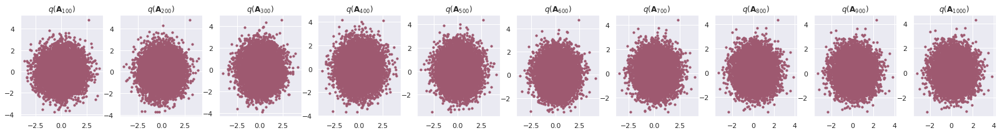

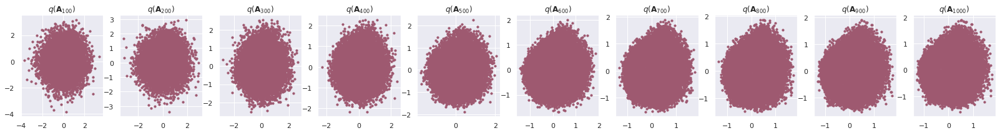

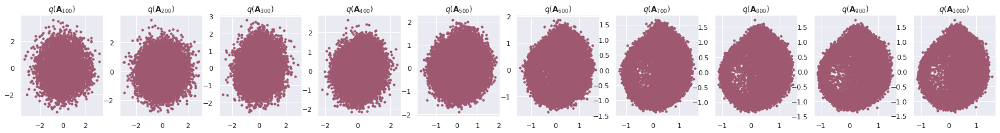

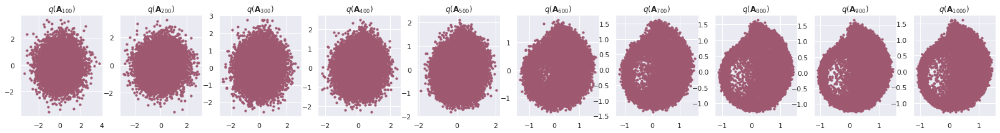

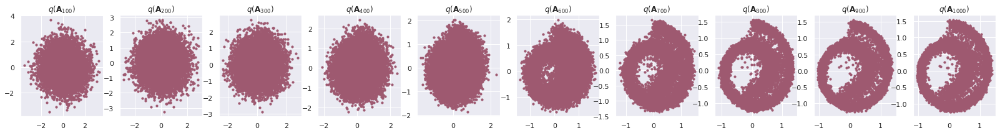

...

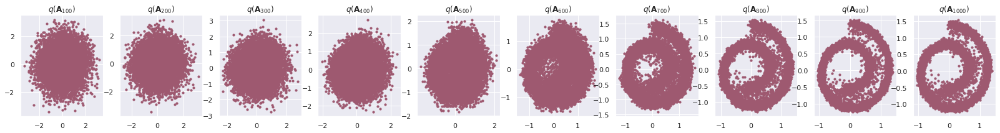

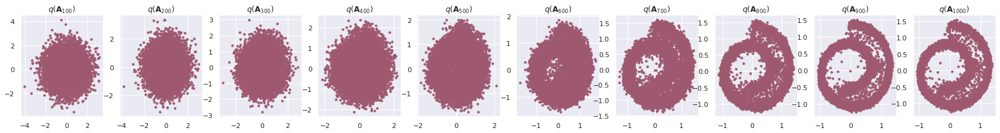

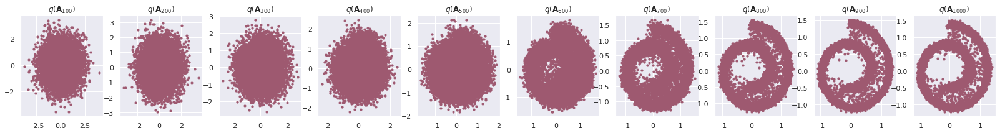

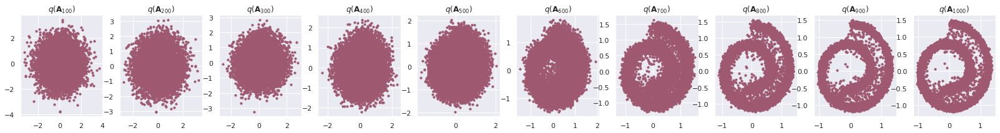

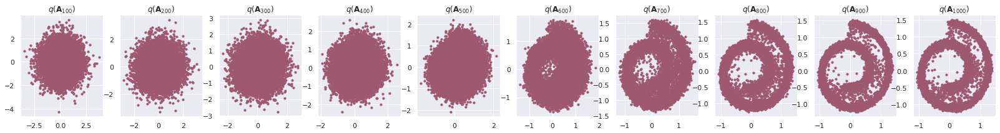

In [ ]:
model = ConditionalModel(n_steps)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
dataset = torch.tensor(data.T).float()
ema = EMA(0.9)
ema.register(model)
batch_size = 128
for t in range(2001):
    permutation = torch.randperm(dataset.size()[0])
    for i in range(0, dataset.size()[0], batch_size):
        indices = permutation[i:i+batch_size]
        batch_x = dataset[indices]
        loss = noise_estimation_loss(model, batch_x)
        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)
        optimizer.step()
        ema.update(model)
    if (t % 200 == 0):
        print(loss)
        x_seq = p_sample_loop(model, dataset.shape)
        fig, axs = pt.subplots(1, 10, figsize=(28, 3))
        for i in range(1, 11):
            cur_x = x_seq[i * 10].detach()
            axs[i-1].scatter(cur_x[:, 0], cur_x[:, 1], s=10, color="#9e5970");
            #axs[i-1].set_axis_off(); 
            axs[i-1].set_title('$q(\mathbf{A}_{'+str(i*100)+'})$')

## **Problem 4:**

Test DDPM on MNIST dataset. Visualize the denoising process.

In [ ]:
#Import
!pip install einops
!pip install torch trochvision

import matplotlib.pyplot as plot
from torchvision import transforms
from torch.utils.data import DataLoader
from argparse import ArgumentParser
from tqdm.auto import tqdm
from torchvision.transforms import Compose, ToTensor, Lambda
from torchvision.datasets.mnist import MNIST

import einops
import torch
import random
import numpy as npy
import torch.nn as ne
from torch.optim import Adam
import imageio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement trochvision (from versions: none)
ERROR: No matching distribution found for trochvision


In [ ]:
SEED = 0
random.seed(SEED)
npy.random.seed(SEED)
torch.manual_seed(SEED)

path_mnist = f"ddpm_model_mnist.pt"

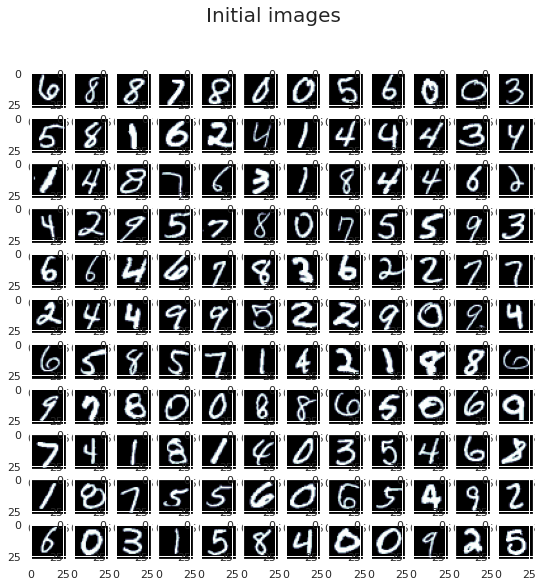

In [ ]:
#Specifying the paramaters
no_of_train = False
mnist = True
batchSize = 132
no_of_epoch = 10
ler = 0.003

def show_image(image, Title=""):

    #Image conversion (CPU numpy arrays)
    if type(image) is torch.Tensor:
        image = image.detach().cpu().numpy()

    #row and column
    fig = plot.figure(figsize=(9, 9))
    row = int(len(image) ** (1 / 2))
    column = round(len(image) / row)

    #Sub-plots populations
    index = 0
    for w in range(row):
        for j in range(column):
            fig.add_subplot(row, column, index + 1)

            if index < len(image):
                plot.imshow(image[index][0], cmap="bone")
                index += 1
    fig.suptitle(Title, fontsize=20)
    plot.show()

def first_batch(loader):
    for batch in loader:
        show_image(batch[0], "Initial images")
        break
#Data loading 
transform = Compose([
    ToTensor(),
    Lambda(lambda x: (x - 0.5) * 2)]
)
ds=MNIST
dataset = ds("./datasets", download=True, train=True, transform=transform)
loader = DataLoader(dataset, batchSize, shuffle=True)

first_batch(loader)


In [ ]:
#Using the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}\t" + (f"{torch.cuda.get_device_name(0)}" if torch.cuda.is_available() else "CPU"))


Using device: cuda	Tesla T4


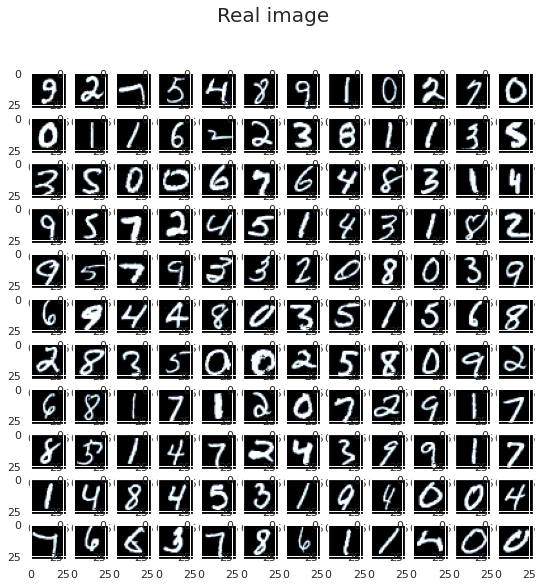

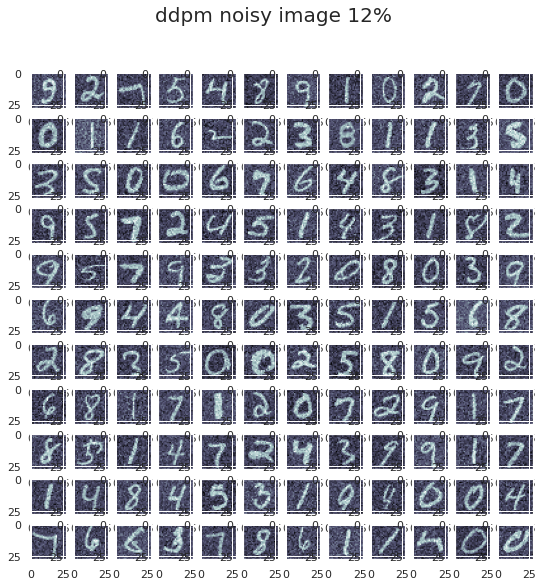

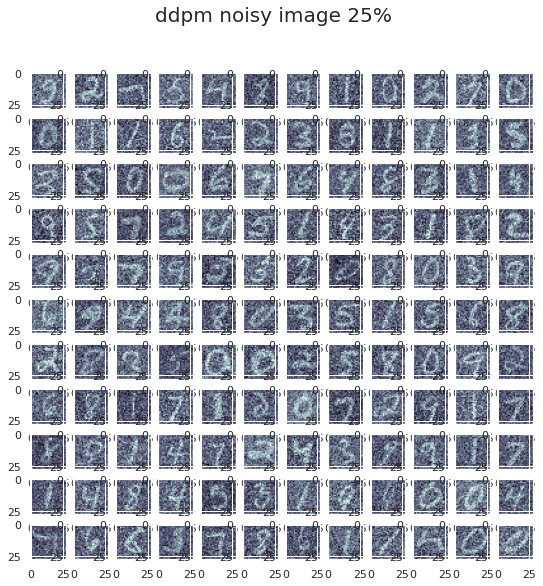

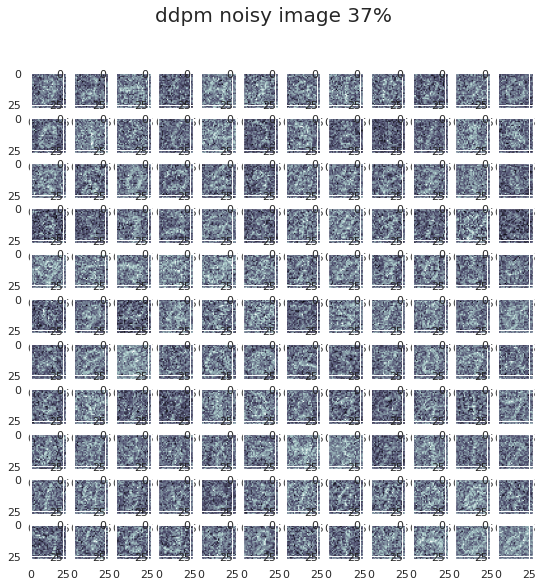

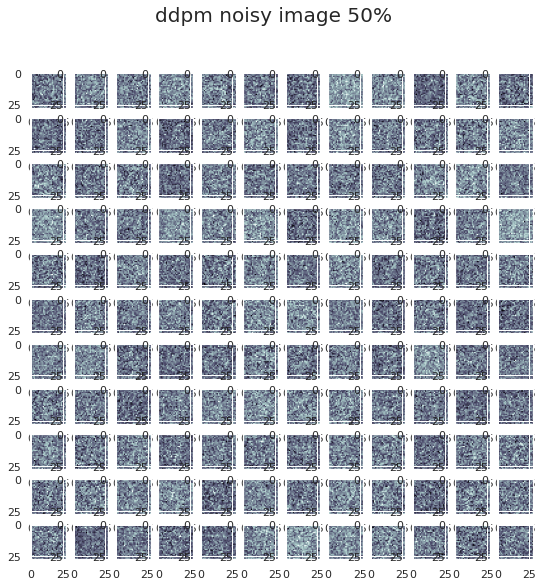

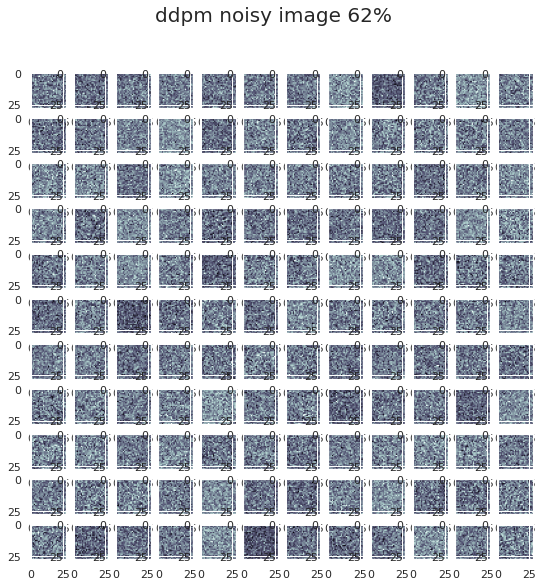

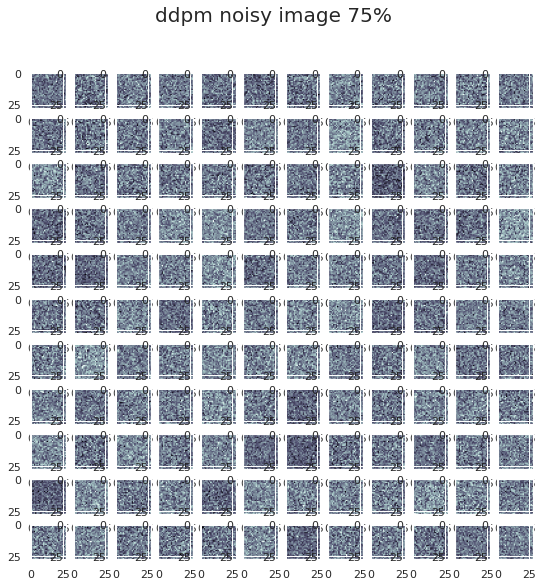

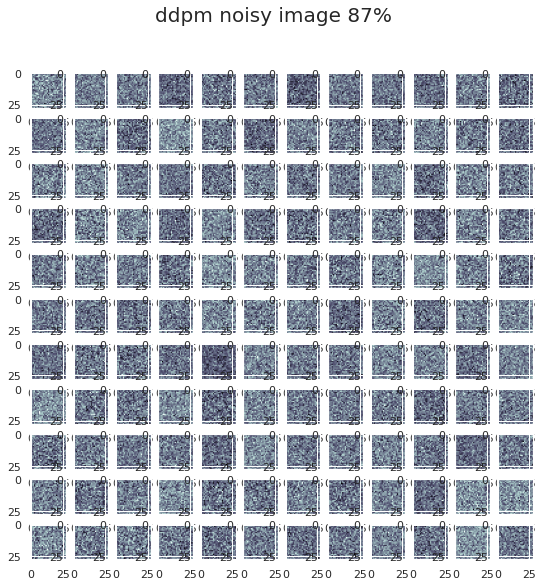

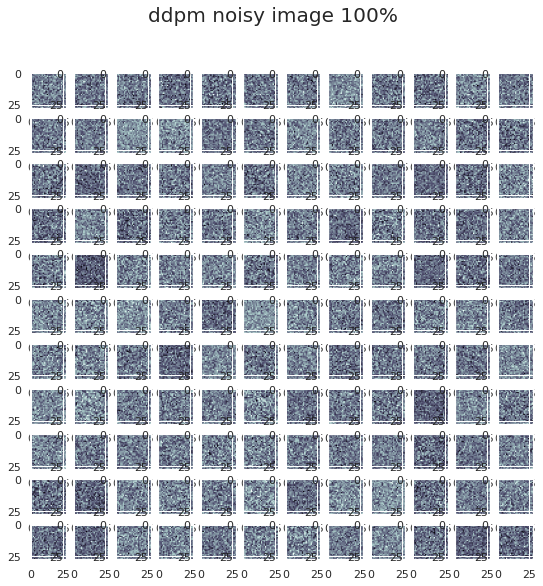

In [ ]:
#Creating the class for DDPM
class yDDPM(ne.Module):
    def __init__(sf, netwrk, steps=200, minimum_beta=10 ** -4, maximum_beta=0.02, device=None, img_chw=(1, 28, 28)):
        super(yDDPM, sf).__init__()
        sf.steps = steps
        sf.device = device
        sf.img_chw = img_chw
        sf.netwrk = netwrk.to(device)
        sf.betas = torch.linspace(minimum_beta, maximum_beta, steps).to(
            device)
        sf.alphas = 1 - sf.betas
        sf.alpha_b = torch.tensor([torch.prod(sf.alphas[:i + 1]) for i in range(len(sf.alphas))]).to(device)

    def forward(sf,x4, t, e_ta=None):
        #Making input images noisy 
        n, c, h, w =x4.shape
        a_bar = sf.alpha_b[t]

        if e_ta is None:
            e_ta = torch.randn(n, c, h, w).to(sf.device)

        noisy = a_bar.sqrt().reshape(n, 1, 1, 1) *x4 + (1 - a_bar).sqrt().reshape(n, 1, 1, 1) * e_ta
        return noisy
 #Making input images noisy 
    def backward(sf, x, t):
        return sf.netwrk(x, t)

 #Forward process
def show_forward(ddpm, loader, device):
    for batch in loader:
        img = batch[0]

        show_image(img, "Real image")

        for percent in [0.12,0.25,0.37,0.5,0.62,0.75,0.87,1]:
            show_image(
                ddpm(img.to(device),
                     [int(percent * ddpm.steps) - 1 for _ in range(len(img))]),
                f"ddpm noisy image {int(percent * 100)}%"
            )
        break


def generating_new_image(ddpm, no_of_samples=16, device=None, frames_per_gif=100, gif="sample.gif", c=1, h=28, w=28):
    frm_idxs = npy.linspace(0, ddpm.steps, frames_per_gif).astype(npy.uint)
    frames = []

    with torch.no_grad():
        if device is None:
            device = ddpm.device

        #Beginning from random noise
        x = torch.randn(no_of_samples, c, h, w).to(device)

        for index, t in enumerate(list(range(ddpm.steps))[::-1]):
            #Removal of estimated noise
            time_tensor = (torch.ones(no_of_samples, 1) * t).to(device).long()
            eta_theta = ddpm.backward(x, time_tensor)

            alphat = ddpm.alphas[t]
            alphatbar = ddpm.alpha_b[t]

            #Partial denoising of the image
            x = (1 / alphat.sqrt()) * (x - (1 - alphat) / (1 - alphatbar).sqrt() * eta_theta)

            if t > 0:
                z = torch.randn(no_of_samples, c, h, w).to(device)

                beta_t = ddpm.betas[t]
                sigma_t = beta_t.sqrt()

                #Langevin Dynamics 
                x = x + sigma_t * z

            
            if index in frm_idxs or t == 0:
                
                normalized = x.clone()
                for i in range(len(normalized)):
                    normalized[i] -= torch.min(normalized[i])
                    normalized[i] *= 255 / torch.max(normalized[i])

                frm = einops.rearrange(normalized, "(b1 b2) c h w -> (b1 h) (b2 w) c", b1=int(no_of_samples ** 0.5))
                frm = frm.cpu().numpy().astype(npy.uint8)

                #Rendering the frame of GIF
                frames.append(frm)

    #GIF storage
    with imageio.get_writer(gif, mode="I") as writer:
        for index, frm in enumerate(frames):
            writer.append_data(frm)
            if index == len(frames) - 1:
                for _ in range(frames_per_gif // 3):
                    writer.append_data(frames[-1])
    return x

#creating the embedding_layer
def sinusoidal_embedding(n, d):
    e_mbedding = torch.tensor([[i / 10_000 ** (2 * j / d) for j in range(d)] for i in range(n)])
    sin_mask = torch.arange(0, n, 2)

    e_mbedding[sin_mask] = torch.sin(e_mbedding[sin_mask])
    e_mbedding[1 - sin_mask] = torch.cos(e_mbedding[sin_mask])

    return e_mbedding

class My_Block(ne.Module):
    def __init__(sf, shape, in_c, out_c, kernel_size=3, stride=1, padding=1, activation=None, normalize=True):
        super(My_Block, sf).__init__()
        sf.ln = ne.LayerNorm(shape)
        sf.conv1 = ne.Conv2d(in_c, out_c, kernel_size, stride, padding)
        sf.conv2 = ne.Conv2d(out_c, out_c, kernel_size, stride, padding)
        sf.activation = ne.SiLU() if activation is None else activation
        sf.normalize = normalize

    def forward(sf, x):
        output = sf.ln(x) if sf.normalize else x
        output = sf.conv1(output)
        output = sf.activation(output)
        output = sf.conv2(output)
        output = sf.activation(output)
        return output

class MyUNet(ne.Module):
    def __init__(sf, steps=1000, time_emb_dim=100):
        super(MyUNet, sf).__init__()

        # sinusoidal_embedding
        sf.time_embed = ne.Embedding(steps, time_emb_dim)
        sf.time_embed.weight.data = sinusoidal_embedding(steps, time_emb_dim)
        sf.time_embed.requires_grad_(False)

        sf.te1 = sf._make_te(time_emb_dim, 1)
        sf.b1 = ne.Sequential(
            My_Block((1, 28, 28), 1, 10),
            My_Block((10, 28, 28), 10, 10),
            My_Block((10, 28, 28), 10, 10)
        )
        sf.down1 = ne.Conv2d(10, 10, 4, 2, 1)

        sf.te2 = sf._make_te(time_emb_dim, 10)
        sf.b2 = ne.Sequential(
            My_Block((10, 14, 14), 10, 20),
            My_Block((20, 14, 14), 20, 20),
            My_Block((20, 14, 14), 20, 20)
        )
        sf.down2 = ne.Conv2d(20, 20, 4, 2, 1)

        sf.te3 = sf._make_te(time_emb_dim, 20)
        sf.b3 = ne.Sequential(
            My_Block((20, 7, 7), 20, 40),
            My_Block((40, 7, 7), 40, 40),
            My_Block((40, 7, 7), 40, 40)
        )
        sf.down3 = ne.Sequential(
            ne.Conv2d(40, 40, 2, 1),
            ne.SiLU(),
            ne.Conv2d(40, 40, 4, 2, 1)
        )

        sf.te_mid = sf._make_te(time_emb_dim, 40)
        sf.b_mid = ne.Sequential(
            My_Block((40, 3, 3), 40, 20),
            My_Block((20, 3, 3), 20, 20),
            My_Block((20, 3, 3), 20, 40)
        )

        sf.up1 = ne.Sequential(
            ne.ConvTranspose2d(40, 40, 4, 2, 1),
            ne.SiLU(),
            ne.ConvTranspose2d(40, 40, 2, 1)
        )

        sf.te4 = sf._make_te(time_emb_dim, 80)
        sf.b4 = ne.Sequential(
            My_Block((80, 7, 7), 80, 40),
            My_Block((40, 7, 7), 40, 20),
            My_Block((20, 7, 7), 20, 20)
        )

        sf.up2 = ne.ConvTranspose2d(20, 20, 4, 2, 1)
        sf.te5 = sf._make_te(time_emb_dim, 40)
        sf.b5 = ne.Sequential(
            My_Block((40, 14, 14), 40, 20),
            My_Block((20, 14, 14), 20, 10),
            My_Block((10, 14, 14), 10, 10)
        )

        sf.up3 = ne.ConvTranspose2d(10, 10, 4, 2, 1)
        sf.te_out = sf._make_te(time_emb_dim, 20)
        sf.b_out = ne.Sequential(
            My_Block((20, 28, 28), 20, 10),
            My_Block((10, 28, 28), 10, 10),
            My_Block((10, 28, 28), 10, 10, normalize=False)
        )

        sf.conv_out = ne.Conv2d(10, 1, 3, 1, 1)

    def forward(sf, x, t):
        t = sf.time_embed(t)
        n = len(x)
        out11 = sf.b1(x + sf.te1(t).reshape(n, -1, 1, 1))  
        out22 = sf.b2(sf.down1(out11) + sf.te2(t).reshape(n, -1, 1, 1)) 
        out33 = sf.b3(sf.down2(out22) + sf.te3(t).reshape(n, -1, 1, 1))

        out_mid = sf.b_mid(sf.down3(out33) + sf.te_mid(t).reshape(n, -1, 1, 1))
        out44 = torch.cat((out33, sf.up1(out_mid)), dim=1) 
        out44 = sf.b4(out44 + sf.te4(t).reshape(n, -1, 1, 1)) 

        out55 = torch.cat((out22, sf.up2(out44)), dim=1)  
        out55 = sf.b5(out55 + sf.te5(t).reshape(n, -1, 1, 1))  

        output = torch.cat((out11, sf.up3(out55)), dim=1)  
        output = sf.b_out(output + sf.te_out(t).reshape(n, -1, 1, 1))  

        output = sf.conv_out(output)

        return output

    def _make_te(sf, dime_in, dime_out):
        return ne.Sequential(
            ne.Linear(dime_in, dime_out),
            ne.SiLU(),
            ne.Linear(dime_out, dime_out)
        )

#Defining the model
steps, minimum_beta, maximum_beta = 1000, 10 ** -4, 0.02 
ddpm = yDDPM(MyUNet(steps), steps=steps, minimum_beta=minimum_beta, maximum_beta=maximum_beta, device=device)

#Forward difussion process
show_forward(ddpm, loader, device)


In [ ]:
def training_loop(ddpm, loader, no_of_epoch, opt, device, display=False, storePath="ddpm_model.pt"):
    ms_e = ne.MSELoss()
    bst_l = float("inf")
    steps = ddpm.steps

    for epoch in tqdm(range(no_of_epoch), desc=f"Training progress", colour="navy"):
        epoch_loss = 0.0
        for step, batch in enumerate(tqdm(loader, leave=False, desc=f"Epoch {epoch + 1}/{no_of_epoch}", colour="#00FFFF")):
            #Data loading
            x4 = batch[0].to(device)
            n = len(x4)
            e_ta = torch.randn_like(x4).to(device)
            t = torch.randint(0, steps, (n,)).to(device)

            noisy_imgs = ddpm(x4, t, e_ta)
            eta_theta = ddpm.backward(noisy_imgs, t.reshape(n, -1))

            #MSE Optimizing b/w the predicted and plugged noise
            loss = ms_e(eta_theta, e_ta)
            opt.zero_grad()
            loss.backward()
            opt.step()

            epoch_loss += loss.item() * len(x4) / len(loader.dataset)

        #Image Displaying
        if display:
            show_image(generating_new_image(ddpm, device=device), f"Images at epoch {epoch + 1}")

        log_string = f"Epoch loss {epoch + 1}: {epoch_loss:.3f}"

        #Model storage
        if bst_l > epoch_loss:
           bst_l = epoch_loss
           torch.save(ddpm.state_dict(), storePath)
           log_string += " -> Best model"

        print(log_string)

#Model is being trained
storePath ="DDPMmnist.pt"
if not no_of_train:
    training_loop(ddpm, loader, no_of_epoch, opt=Adam(ddpm.parameters(), ler), device=device, storePath=storePath)



Training progress:   0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 1: 0.128 -> Best model


Epoch 2/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 2: 0.048 -> Best model


Epoch 3/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 3: 0.040 -> Best model


Epoch 4/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 4: 0.037 -> Best model


Epoch 5/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 5: 0.036 -> Best model


Epoch 6/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 6: 0.035 -> Best model


Epoch 7/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 7: 0.034 -> Best model


Epoch 8/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 8: 0.033 -> Best model


Epoch 9/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 9: 0.033 -> Best model


Epoch 10/10:   0%|          | 0/455 [00:00<?, ?it/s]

Epoch loss 10: 0.032 -> Best model


In [ ]:
#Load (train)
bst_model = yDDPM(MyUNet(),steps=steps, device=device)
bst_model.load_state_dict(torch.load(storePath, map_location=device))
bst_model.eval()
print("Model has been loaded: Producing new images")


Model has been loaded: Producing new images


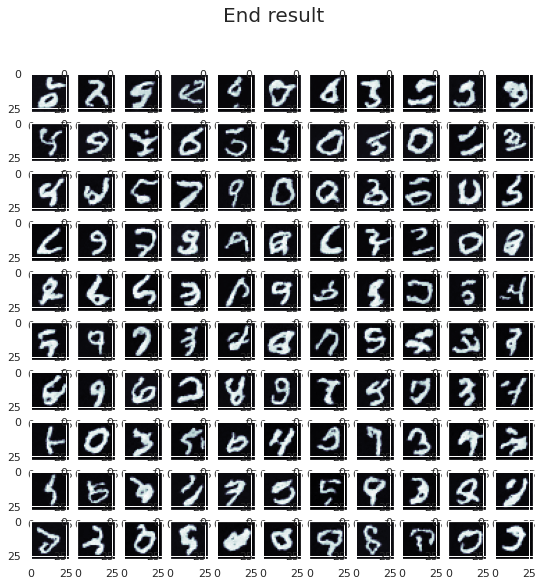

In [ ]:
#Generating the final image
generated = generating_new_image(
        bst_model,
        no_of_samples=110,
        device=device,
        gif="MNIST.gif"
    )
show_image(generated, "End result")


## **Problem 5:** 

Perform an interpolation experiment with your trained model from Previous 

In [ ]:
import torch; torch.manual_seed(0)
import torch.nn.functional as tnf
import torch.utils
import torch.distributions
import torchvision
import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
class Encoder(ne.Module):
    def __init__(self, latent_dims):
        super(Encoder, self).__init__()
        self.linear1 = ne.Linear(784, 512)
        self.linear2 = ne.Linear(512, latent_dims)
    
    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = tnf.relu(self.linear1(x))
        return self.linear2(x)

class Decoder(ne.Module):
    def __init__(self, latent_dims):
        super(Decoder, self).__init__()
        self.linear1 = ne.Linear(latent_dims, 512)
        self.linear2 = ne.Linear(512, 784)
        
    def forward(self, z):
        z = tnf.relu(self.linear1(z))
        z = torch.sigmoid(self.linear2(z))
        return z.reshape((-1, 1, 28, 28))

class Autoencoder(ne.Module):
    def __init__(self, latent_dims):
        super(Autoencoder, self).__init__()
        self.encoder = Encoder(latent_dims)
        self.decoder = Decoder(latent_dims)
    
    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

In [ ]:
def train(autoencoder, data, epochs=20):
    opt = torch.optim.Adam(autoencoder.parameters())
    for epoch in range(epochs):
        for x, y in data:
            x = x.to(device) # GPU
            opt.zero_grad()
            x_hat = autoencoder(x)
            loss = ((x - x_hat)**2).sum()
            loss.backward()
            opt.step()
    return autoencoder

In [ ]:
latent_dims = 2
autoencoder = Autoencoder(latent_dims).to(device) # GPU

data = torch.utils.data.DataLoader(
        torchvision.datasets.MNIST('./data', 
               transform=torchvision.transforms.ToTensor(), 
               download=True),
        batch_size=128,
        shuffle=True)

autoencoder = train(autoencoder, data)

In [ ]:
def plot_reconstructed(autoencoder, r0=(-5, 15), r1=(-15, 5), n=15):
    w = 28
    img = npy.zeros((n*w, n*w))
    for i, y in enumerate(npy.linspace(*r1, n)):
        for j, x in enumerate(npy.linspace(*r0, n)):
            z = torch.Tensor([[x, y]]).to(device)
            x_hat = autoencoder.decoder(z)
            x_hat = x_hat.reshape(28, 28).to('cpu').detach().numpy()
            img[(n-1-i)*w:(n-1-i+1)*w, j*w:(j+1)*w] = x_hat
    plt.imshow(img, extent=[*r0, *r1])

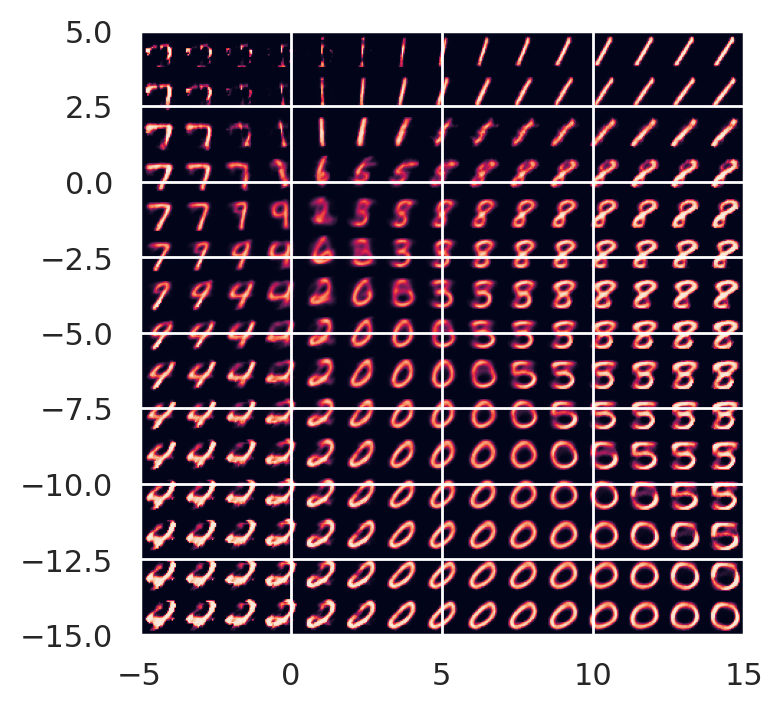

In [ ]:
plot_reconstructed(autoencoder)

In [ ]:
class VariationalEncoder(ne.Module):
    def __init__(self, latent_dims):
        super(VariationalEncoder, self).__init__()
        self.linear1 = ne.Linear(784, 512)
        self.linear2 = ne.Linear(512, latent_dims)
        self.linear3 = ne.Linear(512, latent_dims)
        
        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc.cuda() 
        self.N.scale = self.N.scale.cuda()
        self.kl = 0
    
    def forward(self, x):
        x = torch.flatten(x, start_dim=1)
        x = tnf.relu(self.linear1(x))
        mu =  self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma*self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z

In [ ]:
class VariationalAutoencoder(ne.Module):
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)
    
    def forward(self, x):
        z = self.encoder(x)
        return self.decoder(z)

In [ ]:
def train(autoencoder, data, epochs=20):
    opt = torch.optim.Adam(autoencoder.parameters())
    for epoch in range(epochs):
        for x, y in data:
            x = x.to(device) 
            opt.zero_grad()
            x_hat = autoencoder(x)
            loss = ((x - x_hat)**2).sum() + autoencoder.encoder.kl
            loss.backward()
            opt.step()
    return autoencoder

In [ ]:
vae = VariationalAutoencoder(latent_dims).to(device) 
vae = train(vae, data)

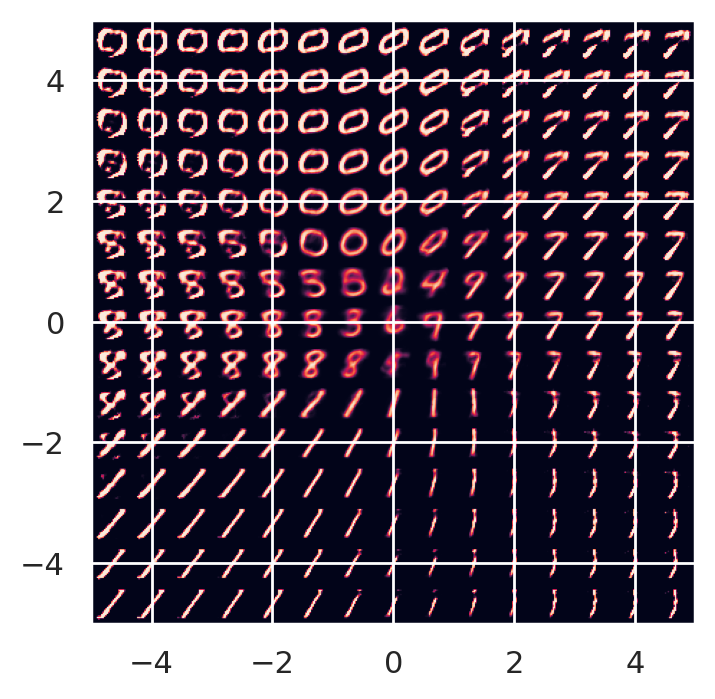

In [ ]:
plot_reconstructed(vae, r0=(-5, 5), r1=(-5, 5))

In [ ]:
#interpolation
def interpolate(autoencoder, x_1, x_2, n=15):
    z_1 = autoencoder.encoder(x_1)
    z_2 = autoencoder.encoder(x_2)
    z = torch.stack([z_1 + (z_2 - z_1)*t for t in npy.linspace(0, 1, n)])
    interpolate_list = autoencoder.decoder(z)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()

    w = 28
    img = npy.zeros((w, n*w))
    for i, x_hat in enumerate(interpolate_list):
        img[:, i*w:(i+1)*w] = x_hat.reshape(28, 28)
    plot.imshow(img)
    plot.xticks([])
    plot.yticks([])

In [ ]:
x, y = next(data.__iter__()) 
x_1 = x[y == 3][1].to(device) 
x_2 = x[y == 8][1].to(device) 

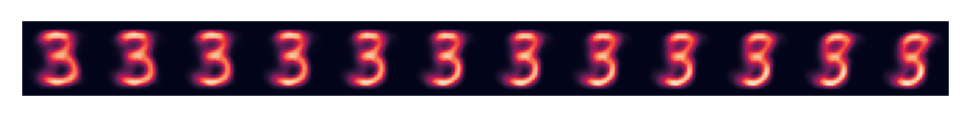

In [ ]:
#Autoencoder
interpolate(autoencoder, x_1, x_2, n=12)

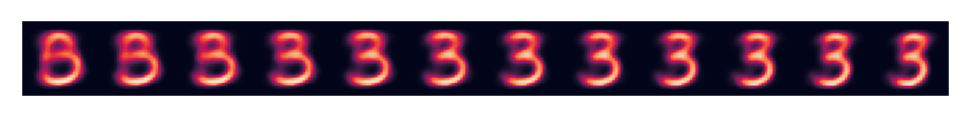

In [ ]:
#VariationalAutoencoder
interpolate(vae, x_1, x_2, n=12)